In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob as glob
import scipy.constants as const
_c = const.c*10**(-3) # km/s

In [11]:
detections = np.loadtxt('./data/Maccagni/spectra_list_detections.txt', dtype=str)
source_list = pd.read_csv('./data/Maccagni/source_list_long.csv')
old_list = ['J080938.88+345537.2', 'J083637.84+440109.6', 'J084307.11+453742.8', 'J090937.44+192808.2', 'J112030.04+273610.7', 'J120231.12+163741.8', 'J093551.59+612111.3']
flagged_list = ['J120855.60+464113.8', 'J125433.26+185602.2', 'J130132.61+463402.7', 'J105327.25+205835.9', 'J120551.46+203119.0']

In [14]:
detections[0].split('./')[1]

'J075756.71+395936.1/final/abs/spec/J075756.71+395936.1_spec.txt'

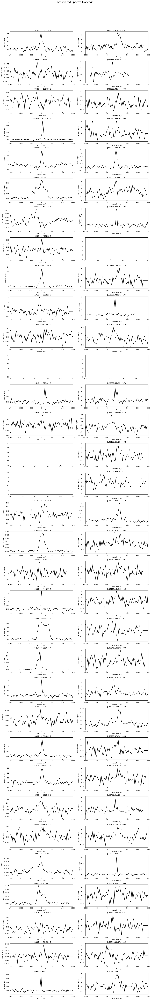

In [16]:
plt.figure(figsize=(15, 100))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra Maccagni", fontsize=18)
for n, i in enumerate(detections):
    ax = plt.subplot(33, 2, n + 1)
    name = i.split('/')[-1].split('_spec')[0]
    if name in flagged_list:
        continue
    else:
        
        if name in old_list:
            path = './data/Maccagni/spectraArcHIve/' + i.split('./')[1]
        else:
            path = './data/Maccagni/spectra_correct/spectra_correct/' + i.split('/')[-1]
        spec = np.genfromtxt(path,names=True)
        freq = spec['freqHz']
        flux = spec['fluxJybeam']
        tau = spec['tau']
        tau_noise = spec['tau_noise']
        z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
        freq1 = freq*1e-6*(1.0 + z0)
        fr = 1420.405752
        v  = (fr - freq1)/freq1*_c

        l = zip(v, -tau, -tau_noise)
        df = pd.DataFrame(l, columns=["velocity","tau","tau_noise"])
        np.savetxt('./optical_depth_vs_velocity/Associated_spectra/'+name+'.txt', df.values, fmt='%f')
        ax.plot(v,-tau, color='black', linestyle='solid', label='new')
        ax.set_ylabel('Optical depth')
        ax.set_xlabel('Velocity km/s')
        ax.set_title(name)
        ax.set_xlim(-1500, 1500)
        fig = ax.get_figure()
        fig.tight_layout()
        fig.subplots_adjust(top=0.95)
# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

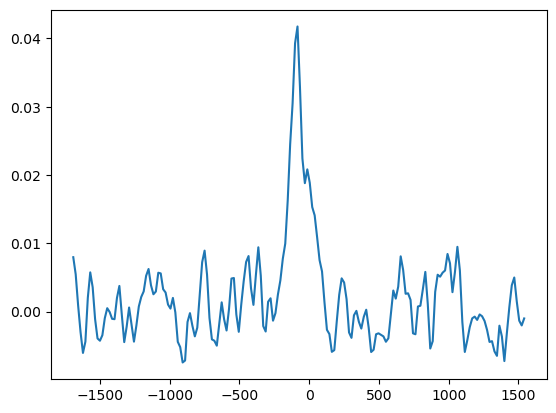

In [8]:
i = detections[0]
name = i.split('/')[-1].split('_spec')[0]
path = './data/Maccagni/spectra_correct/spectra_correct/' + i.split('/')[-1]
spec = np.genfromtxt(path,names=True)
freq = spec['freqHz']
flux = spec['fluxJybeam']
tau = spec['tau']
z = 0.066
freq1 = freq*1e-6*(1.0 + z) # MHz
fr = 1420.405752  # MHz
v  = (fr - freq1)/freq1*_c
# plt.plot(v,-np.log(1+(flux/0.092)))
plt.plot(v,-tau)

In [11]:
detections

array(['./J075756.71+395936.1/final/abs/spec/J075756.71+395936.1_spec.txt',
       './J080601.51+190614.7/final/abs/spec/J080601.51+190614.7_spec.txt',
       './J080938.88+345537.2/final/abs/spec/J080938.88+345537.2_spec.txt',
       './J082133.60+470237.3/final/abs/spec/J082133.60+470237.3_spec.txt',
       './J083548.14+151717.0/final/abs/spec/J083548.14+151717.0_spec.txt',
       './J083637.84+440109.6/final/abs/spec/J083637.84+440109.6_spec.txt',
       './J084307.11+453742.8/final/abs/spec/J084307.11+453742.8_spec.txt',
       './J090325.54+162256.0/final/abs/spec/J090325.54+162256.0_spec.txt',
       './J090734.91+325722.9/final/abs/spec/J090734.91+325722.9_spec.txt',
       './J090937.44+192808.2/final/abs/spec/J090937.44+192808.2_spec.txt',
       './J093551.59+612111.3/final/abs/spec/J093551.59+612111.3_spec.txt',
       './J102053.67+483124.3/final/abs/spec/J102053.67+483124.3_spec.txt',
       './J102400.53+511248.1/final/abs/spec/J102400.53+511248.1_spec.txt',
       './J1

In [17]:
for n, i in enumerate(detections):
    if i.split('/')[-1].split('_spec')[0] == 'J130132.61+463402.7':
        print(n)
    else:
        pass

30


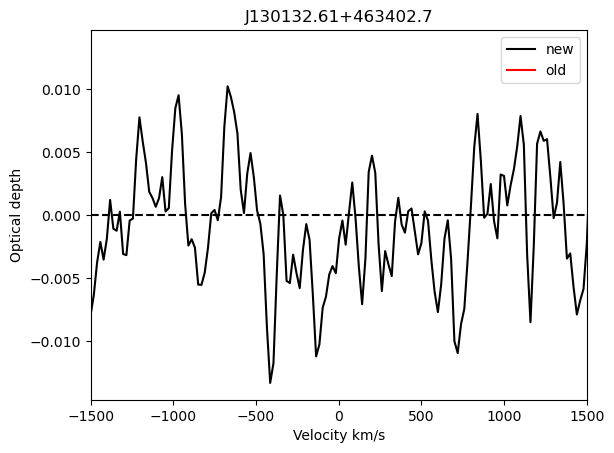

In [24]:
i = detections[30]
name = i.split('/')[-1].split('_spec')[0]
path = './data/Maccagni/spectra_correct/spectra_correct/' + i.split('/')[-1]
spec = np.genfromtxt(path,names=True)
freq = spec['freqHz']
flux = spec['fluxJybeam']
tau = spec['tau']
z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
freq1 = freq*1e-6*(1.0 + z0)
fr = 1420.405752
v  = (fr - freq1)/freq1*_c
plt.plot(v,tau, color='black', linestyle='solid', label='new')


path_ = './data/Maccagni/spectraArcHIve/'+name+'/final/abs/spec/'+name+'_spec.txt'
spec_ = np.genfromtxt(path_,names=True)
freq_ = spec_['freqHz']
flux_ = spec_['fluxJybeam']
tau_ = spec_['tau']
z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
freq1_ = freq_*1e-6*(1.0 + z0)
fr = 1420.405752
v_  = (fr - freq1_)/freq1_*_c
plt.plot(v_,-tau_, color='red', linestyle='solid', label='old')


plt.legend()
plt.title(name)
plt.ylabel('Optical depth')
plt.xlabel('Velocity km/s')
plt.axhline(y=0, linestyle='dashed', color='black')
plt.xlim(-1500, 1500)
plt.show()

# np.savetxt('./Associated_optical_depth/'+sg[-1], spec)


Encountered the error "no field of name tau" for source J135217.88+312646.4


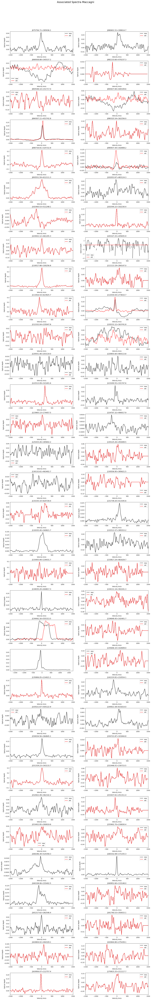

In [5]:
plt.figure(figsize=(15, 100))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra Maccagni", fontsize=18)
for n, i in enumerate(detections):
    ax = plt.subplot(33, 2, n + 1)
    name = i.split('/')[-1].split('_spec')[0]
    if name == 'J093551.59+612111.3':
        path = './data/Maccagni/spectraArcHIve/J093551.59+612111.3/final/abs/spec/J093551.59+612111.3_spec.txt'
    else:
        path = './data/Maccagni/spectra_correct/spectra_correct/' + i.split('/')[-1]
    spec = np.genfromtxt(path,names=True)
    freq = spec['freqHz']
    flux = spec['fluxJybeam']
    tau = spec['tau']
    z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
    freq1 = freq*1e-6*(1.0 + z0)
    fr = 1420.405752
    v  = (fr - freq1)/freq1*_c
    ax.plot(v,-tau, color='black', linestyle='solid', label='new')


    path_ = './data/Maccagni/spectraArcHIve/'+name+'/final/abs/spec/'+name+'_spec.txt'
    spec_ = np.genfromtxt(path_,names=True)
    freq_ = spec_['freqHz']
    flux_ = spec_['fluxJybeam']
    try:
        tau_ = spec_['tau']
        z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
        freq1_ = freq_*1e-6*(1.0 + z0)
        fr = 1420.405752
        v_  = (fr - freq1_)/freq1_*_c
        ax.plot(v_,-tau_, color='red', linestyle='solid', label='old')


        ax.legend()
        ax.set_ylabel('Optical depth')
        ax.set_xlabel('Velocity km/s')
        ax.set_title(name)
        ax.set_xlim(-1500, 1500)
        fig = ax.get_figure()
        fig.tight_layout()
        fig.subplots_adjust(top=0.95)
    except ValueError as e:
        print('Encountered the error "{}" for source {}'.format(e, name))
# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

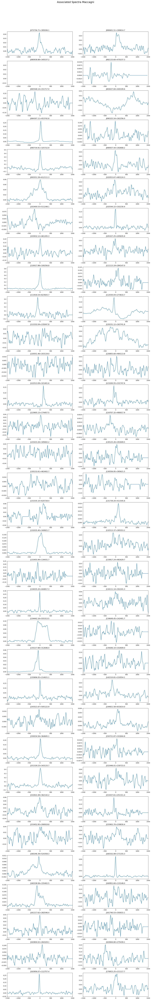

In [35]:
plt.figure(figsize=(15, 100))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra Maccagni", fontsize=18)
for n, i in enumerate(detections):
    result = []
    ax = plt.subplot(33, 2, n + 1)
    name = i.split('/')[-1].split('_spec')[0]
    z0 = source_list.loc[source_list['J2000'] == name, 'z'].values[0]
    S = (source_list.loc[source_list['J2000'] == name, 'S_cont'].values[0])*(10**(-3))
    f0 = 1420405752/(1 + z0)
    sg = i.split('/')
    if name == 'J093551.59+612111.3':
        i_c = './data/Maccagni/spectraArcHIve/J093551.59+612111.3/final/abs/spec/J093551.59+612111.3_spec.txt'
    elif name == 'J105327.25+205835.9':
        i_c = './data/Maccagni/spectraArcHIve/J105327.25+205835.9/final/abs/spec/J105327.25+205835.9_spec.txt'
    elif name == 'J080938.88+345537.2':
        i_c == './data/Maccagni/spectraArcHIve/J080938.88+345537.2/final/abs/spec/J080938.88+345537.2_spec.txt'
    else:
        i_c = './data/Maccagni/spectra_correct/spectra_correct/' + sg[-1]
    loaded = np.loadtxt(i_c)
    c = 299792.458
    velocity = [((f0 - x)*c)/x for x in loaded[:,0]]
    velocity = np.array(velocity)

    continum = 1 + loaded[:,2]/S
    continum_checked = np.maximum(continum, 0.01)
    
    optical_depth = -np.log(continum_checked)
    spec = np.column_stack([velocity, optical_depth])
    ax.plot(spec[:,0], spec[:,1])
    np.savetxt('./Associated_optical_depth/'+sg[-1], spec)
    ax.set_title(name)
    ax.set_xlim(-1500, 1500)
    fig = ax.get_figure()
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

In [17]:
lis = glob.glob('./Associated_optical_depth/temp/*')

In [18]:
lis

['./Associated_optical_depth/temp/0003+380_ak18.DAT',
 './Associated_optical_depth/temp/0035+22_omd+17.DAT',
 './Associated_optical_depth/temp/0941-08_omd+17.DAT',
 './Associated_optical_depth/temp/101301.DAT',
 './Associated_optical_depth/temp/1045+35A_adi.DAT',
 './Associated_optical_depth/temp/1142+052_kpec09.DAT',
 './Associated_optical_depth/temp/1200+045_ak17.DAT',
 './Associated_optical_depth/temp/1245-197_ak17.DAT',
 './Associated_optical_depth/temp/1504+377_cmr+98.DAT',
 './Associated_optical_depth/temp/J01465-0157_adi19.DAT',
 './Associated_optical_depth/temp/SPEC_J0919+0146.DAT',
 './Associated_optical_depth/temp/SPEC_J1521+5508.DAT']

In [44]:
spec_details = pd.read_csv('./data/Spectra_list - Associated.csv')

In [45]:
spec_details.loc[:, ['Name (File Name)', 'Absorber Redshift', 'Background Source Flux Density (Jy)']]

,Name (File Name),Absorber Redshift,Background Source Flux Density (Jy)
0,0003+380_ak18.DAT,0.22900,0.5473
1,0035+22_omd+17.DAT,0.09600,0.5830
2,0941-08_omd+17.DAT,0.22810,2.5800
3,101301.DAT,0.94959,0.8919
4,1045+35A_adi.DAT,0.84644,0.5529
5,1142+052_kpec09.DAT,1.34310,1.0100
6,1200+045_ak17.DAT,1.22600,1.6752
7,1245-197_ak17.DAT,1.27500,8.3022
8,J01465-0157_adi19.DAT,0.95904,1.8038
9,SPEC_J0919+0146.DAT,1.27308,0.1830


In [46]:
spec_details.loc[spec_details['Name (File Name)'] == '1200+045_ak17.DAT', 'Absorber Redshift'].values[0]

1.226

0003+380_ak18.DAT
0035+22_omd+17.DAT
0941-08_omd+17.DAT
101301.DAT
1045+35A_adi.DAT
1142+052_kpec09.DAT
1200+045_ak17.DAT
1245-197_ak17.DAT
1504+377_cmr+98.DAT
J01465-0157_adi19.DAT
SPEC_J0919+0146.DAT
SPEC_J1521+5508.DAT


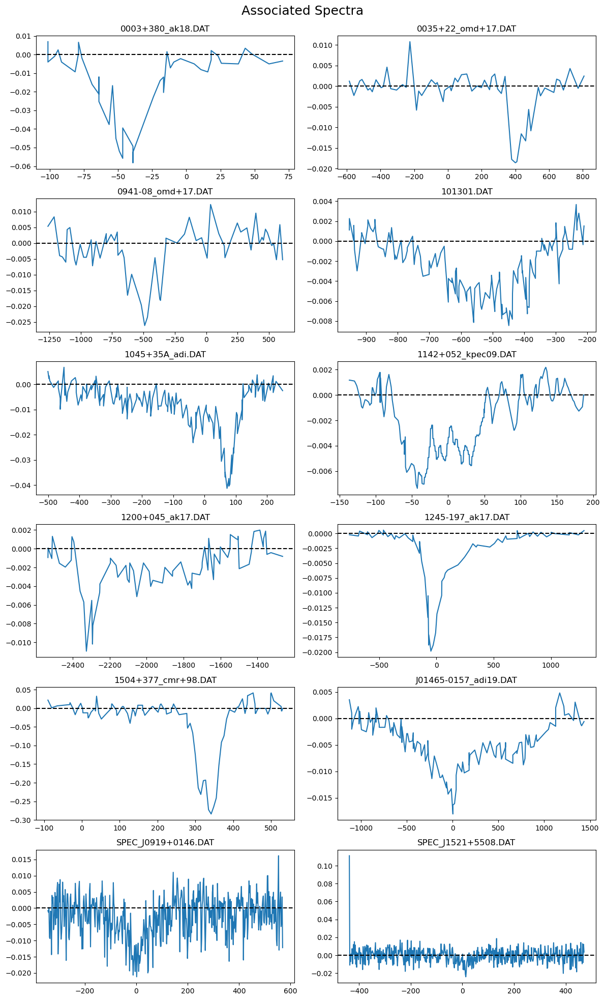

In [47]:
plt.figure(figsize=(12, 20))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra", fontsize=18)
for n, i in enumerate(lis):
    ax = plt.subplot(6, 2, n + 1)
    name = i.split('/')[-1]
    z0 = spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0]
    S = (spec_details.loc[spec_details['Name (File Name)'] == name, 'Background Source Flux Density (Jy)'].values[0])
    f0 = 1420405752/(1 + z0)
    i_c = './Associated_optical_depth/temp/' + name
    loaded = np.loadtxt(i_c)
    c = 299792.458
    print(name)
    if name in ['0003+380_ak18.DAT', '101301.DAT', '1045+35A_adi.DAT', '1142+052_kpec09.DAT', '1200+045_ak17.DAT', '1245-197_ak17.DAT', '1504+377_cmr+98.DAT', 'J01465-0157_adi19.DAT']:
        flux = -loaded[:,1]*(10**-3)
    else:
        flux = -loaded[:,1]
    velocity = loaded[:,0]
    continum = 1 - flux/S
    continum_checked = np.maximum(continum, 0.01)
    optical_depth = -np.log(continum_checked)
    spec = np.column_stack([velocity, optical_depth])

    l = zip(velocity, optical_depth)
    df = pd.DataFrame(l, columns=["velocity","tau"])
    np.savetxt('./optical_depth_vs_velocity/Associated_spectra/no_noise/'+name, df.values, fmt='%f')

    ax.plot(spec[:,0], spec[:,1])
    ax.set_title(name)
    ax.axhline(y=0, color='black', linestyle='dashed')
    # ax.set_xlim(-1500, 1500)
    fig = ax.get_figure()
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

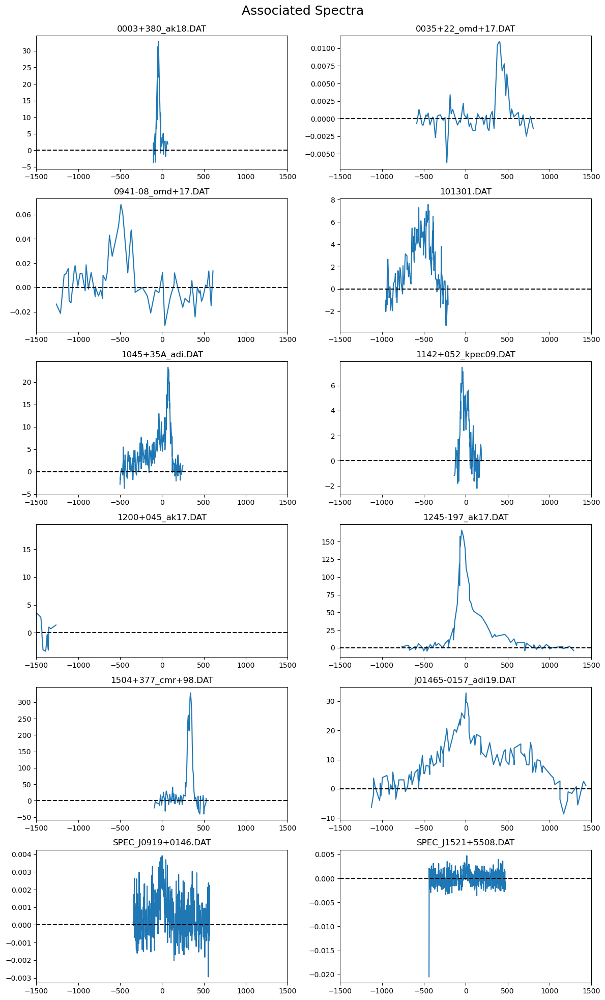

In [42]:
plt.figure(figsize=(12, 20))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra", fontsize=18)
for n, i in enumerate(lis):
    result = []
    ax = plt.subplot(6, 2, n + 1)
    name = i.split('/')[-1].split('_spec')[0]
    z0 = spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0]
    S = (spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0])
    f0 = 1420405752/(1 + z0)
    i_c = './Associated_optical_depth/temp/' + name
    loaded = np.loadtxt(i_c)
    c = 299792.458
    ax.plot(loaded[:,0], loaded[:,1])
    ax.set_title(name)
    ax.axhline(y=0, color='black', linestyle='dashed')
    ax.set_xlim(-1500, 1500)
    fig = ax.get_figure()
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

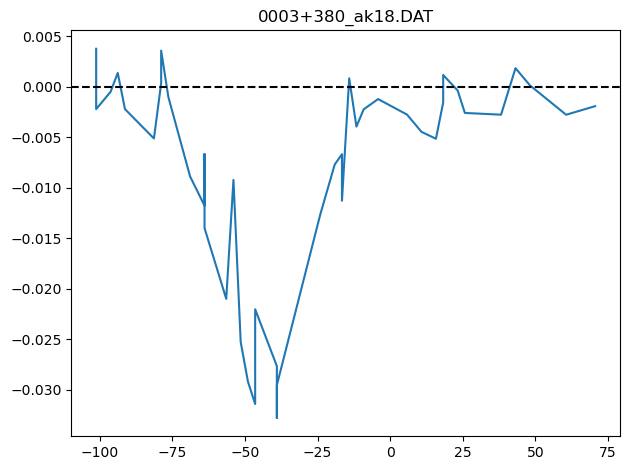

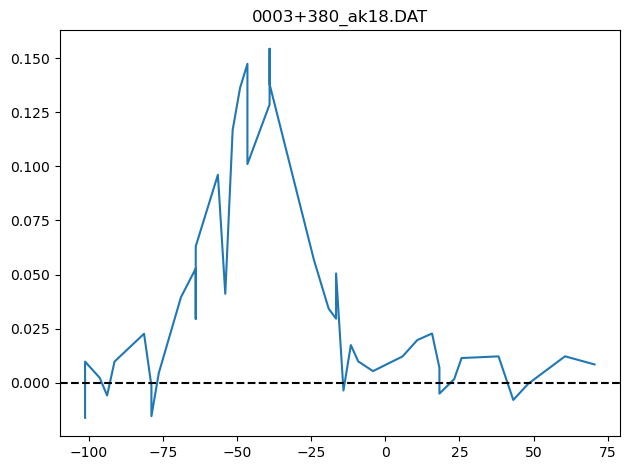

In [51]:
i = lis[0]
name = i.split('/')[-1]
z0 = spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0]
S = (spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0])
f0 = 1420405752/(1 + z0)
i_c = './Associated_optical_depth/temp/' + name
loaded = np.loadtxt(i_c)
c = 299792.458
plt.plot(loaded[:,0], - loaded[:,1]*(10**-3))
plt.title(name)
plt.axhline(y=0, color='black', linestyle='dashed')
plt.tight_layout()
plt.show()

velocity = loaded[:,0]
continum = 1 - loaded[:,1]*(10**-3)/S
continum_checked = np.maximum(continum, 0.01)
optical_depth = -np.log(continum_checked)
spec = np.column_stack([velocity, optical_depth])
plt.plot(spec[:,0], spec[:,1]) 
plt.title(name)
plt.axhline(y=0, color='black', linestyle='dashed')
plt.tight_layout()
plt.show()

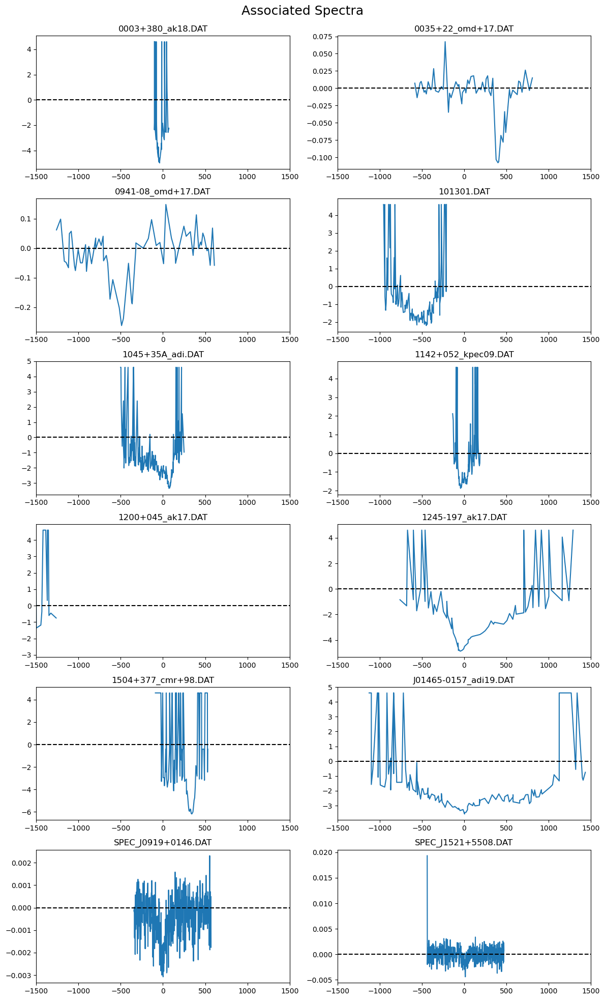

In [29]:
plt.figure(figsize=(12, 20))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra", fontsize=18)
for n, i in enumerate(lis):
    result = []
    ax = plt.subplot(6, 2, n + 1)
    name = i.split('/')[-1].split('_spec')[0]
    z0 = spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0]
    S = (spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0])
    f0 = 1420405752/(1 + z0)
    i_c = './Associated_optical_depth/temp/' + name
    loaded = np.loadtxt(i_c)
    c = 299792.458
    # velocity = [((f0 - x)*c)/x for x in loaded[:,0]]
    velocity = loaded[:,0]

    continum = 1 + loaded[:,1]/S
    continum_checked = np.maximum(continum, 0.01)
    
    optical_depth = -np.log(continum_checked)
    spec = np.column_stack([velocity, optical_depth])
    ax.plot(spec[:,0], spec[:,1])
    ax.set_title(name)
    ax.axhline(y=0, color='black', linestyle='dashed')
    ax.set_xlim(-1500, 1500)
    fig = ax.get_figure()
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

0003+380_ak18.DAT
0035+22_omd+17.DAT
0941-08_omd+17.DAT


/tmp/ipykernel_14069/2559519366.py:17: RuntimeWarning: invalid value encountered in log
  optical_depth = -np.log(1 + loaded[:,1]/S)


101301.DAT
1045+35A_adi.DAT
1142+052_kpec09.DAT
1200+045_ak17.DAT
1245-197_ak17.DAT
1504+377_cmr+98.DAT
J01465-0157_adi19.DAT
SPEC_J0919+0146.DAT
SPEC_J1521+5508.DAT


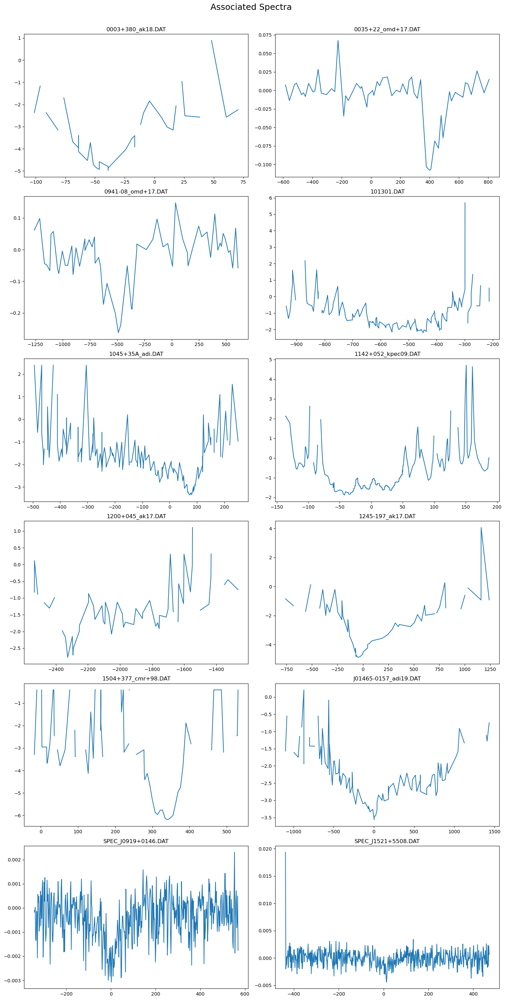

In [53]:
plt.figure(figsize=(15, 30))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Associated Spectra ", fontsize=18)
for n, i in enumerate(lis):
    result = []
    ax = plt.subplot(6, 2, n + 1)
    name = i.split('/')[-1]
    print(name)
    z0 = spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0]
    S = (spec_details.loc[spec_details['Name (File Name)'] == name, 'Absorber Redshift'].values[0])
    f0 = 1420405752/(1 + z0)
    i_c = './Associated_optical_depth/temp/' + name
    loaded = np.loadtxt(i_c)
    c = 299792.458
    # velocity = [((f0 - x)*c)/x for x in loaded[:,0]]
    velocity = loaded[:,0]
    optical_depth = -np.log(1 + loaded[:,1]/S)
    spec = np.column_stack([velocity, optical_depth])
    ax.plot(spec[:,0], spec[:,1])
    # np.savetxt('./Associated_optical_depth/'+name, spec)
    ax.set_title(name)
    # ax.set_xlim(-500, 500)
    fig = ax.get_figure()
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# plt.savefig('Maccagni Relative velocity for corrected associated spectra')

# Intervening

In [69]:
from glob import glob
list_int = np.sort(glob('./Intervening_velocity_spectrum/*'))

In [70]:
spec_details = pd.read_csv('./intervening_absorber_redshift.csv')
spec_details.loc[:, ['Name (File Name)', 'Absorber Redshift', 'Background Source Flux Density (Jy)']]

,Name (File Name),Absorber Redshift,Background Source Flux Density (Jy)
0,1430-kpec09.dat,1.32690,1.0500
1,1830-211_cdn99.DAT,0.88582,10.5000
2,SPEC_J0041S.DAT,0.01769,0.2150
3,SPEC_J0849_2.DAT,0.31207,0.2330
4,SPEC_J0921+6215.DAT,1.10360,1.3320
5,SPEC_J1241.DAT,0.14295,0.6800
6,SPEC_J1243.DAT,0.01714,0.1960
7,SPEC_J1255+1817.DAT,0.75761,0.8560
8,SPEC_J1327+4326.DAT,0.95421,0.6470
9,SPEC_J1342+5110.DAT,1.48815,0.1570


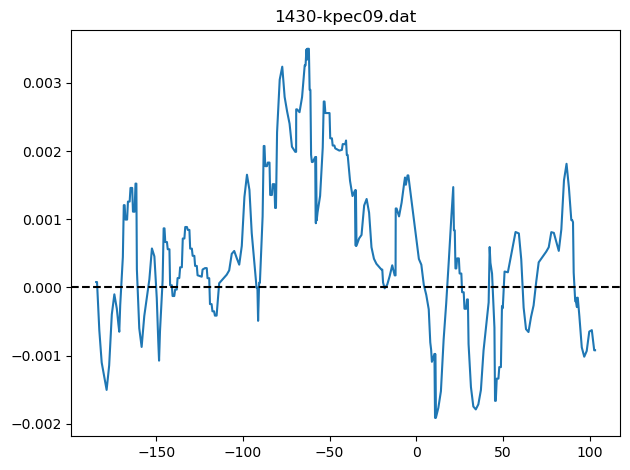

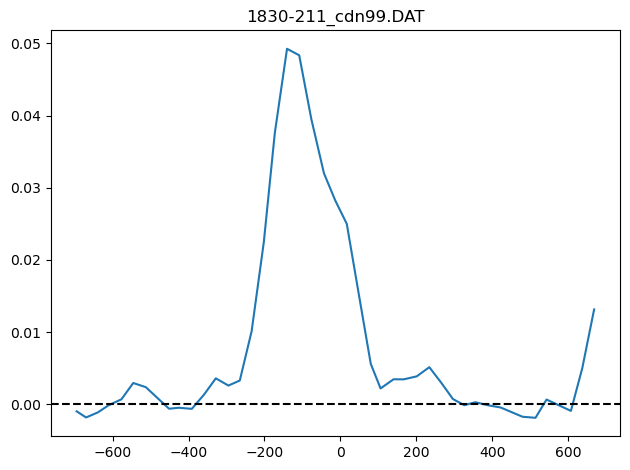

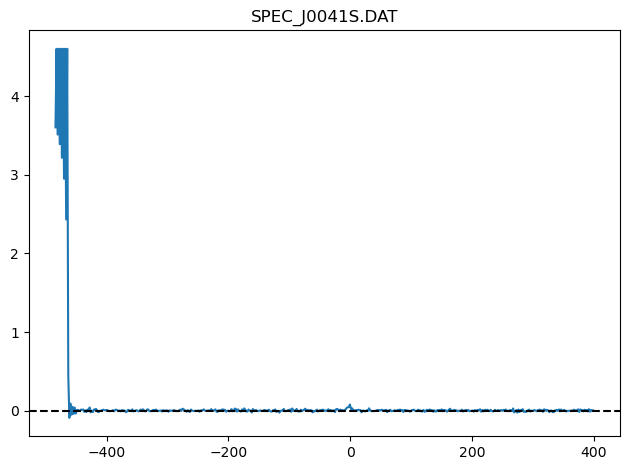

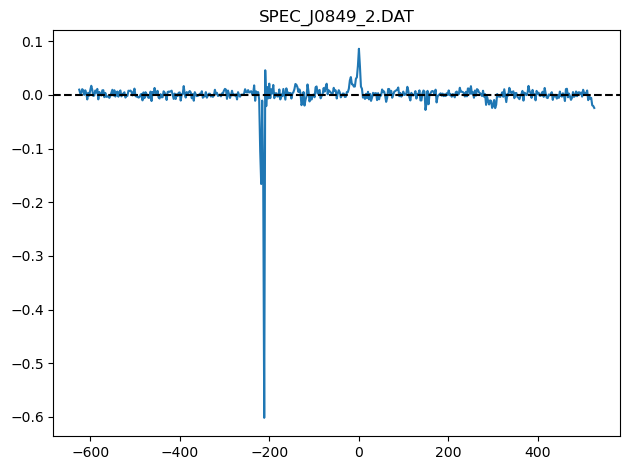

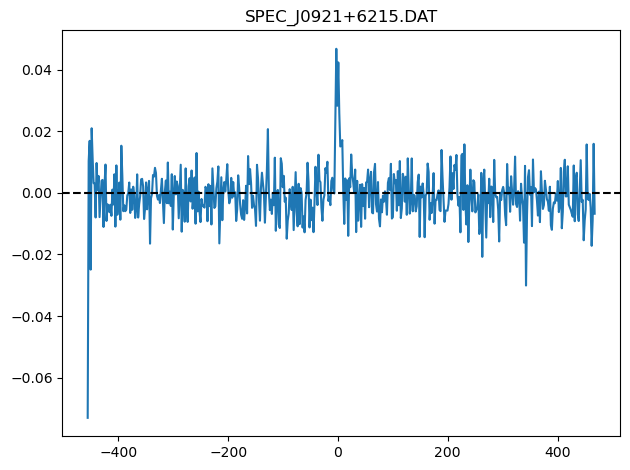

...

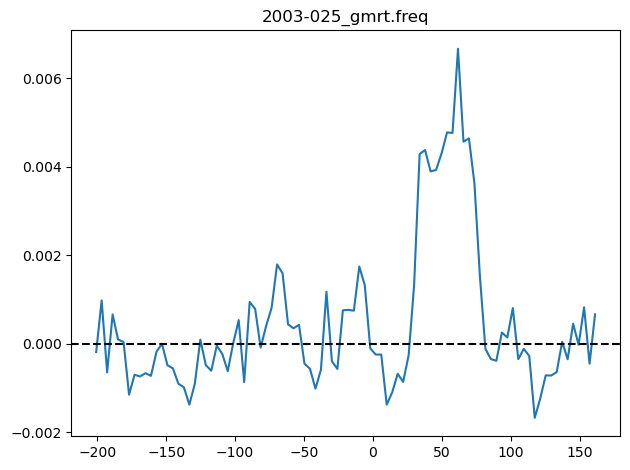

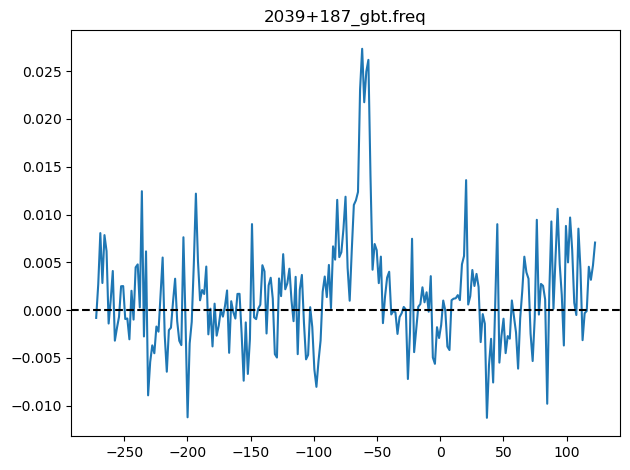

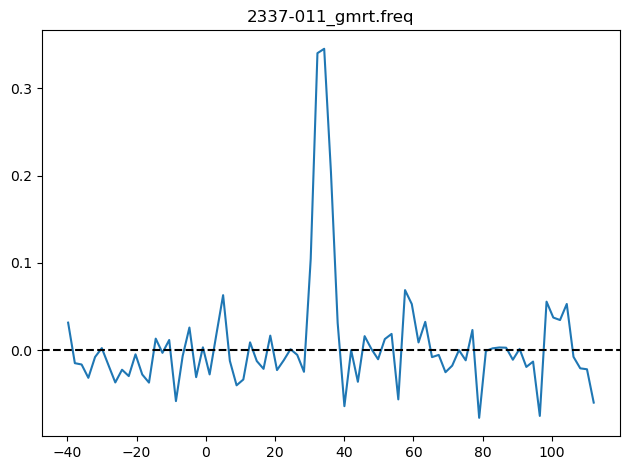

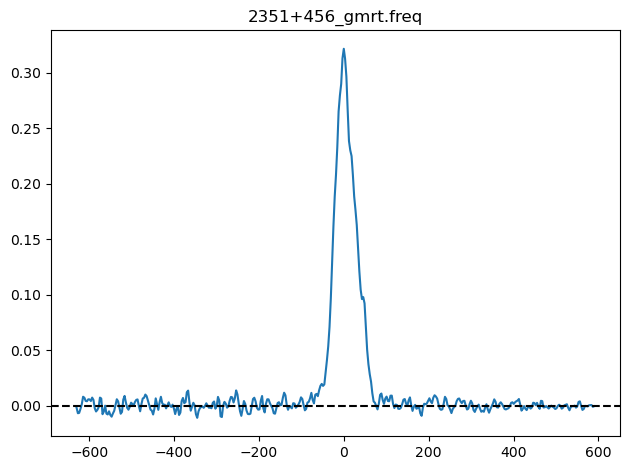

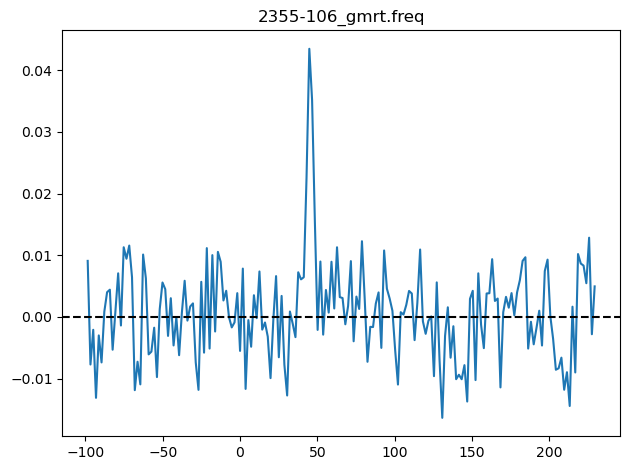

In [71]:
for i in spec_details.iloc[:, 0].values:
    z0 = spec_details.loc[spec_details['Name (File Name)'] == i, 'Absorber Redshift'].values[0]
    S = (spec_details.loc[spec_details['Name (File Name)'] == i, 'Background Source Flux Density (Jy)'].values[0])
    f0 = 1420405752/(1 + z0)
    i_c = './Intervening_velocity_spectrum/' + i
    loaded = np.loadtxt(i_c)
    c = 299792.458
    velocity = loaded[:,0]
    if i == '1430-kpec09.dat':
        continum = 1 - loaded[:,1]*(10**-3)/S
    else:
        continum = 1 - loaded[:,1]/S
    continum_checked = np.maximum(continum, 0.01)
    optical_depth = -np.log(continum_checked)
    spec = np.column_stack([velocity, optical_depth])
    l = zip(velocity, optical_depth)
    df = pd.DataFrame(l, columns=["velocity","tau"])
    np.savetxt('./optical_depth_vs_velocity/Intervening_spectra/'+i, df.values, fmt='%f')
    plt.plot(spec[:,0], spec[:,1]) 
    plt.title(i)
    plt.axhline(y=0, color='black', linestyle='dashed')
    plt.tight_layout()
    plt.show()

In [72]:
loaded

array([[ 2.29339094e+02,  2.07060000e-03],
       [ 2.27547382e+02, -1.18450000e-03],
       [ 2.25755670e+02,  5.35760000e-03],
       [ 2.23963959e+02,  2.28510000e-03],
       [ 2.22172247e+02,  3.47650000e-03],
       [ 2.20380535e+02,  3.61570000e-03],
       [ 2.18588824e+02,  4.25470000e-03],
       [ 2.16797112e+02, -3.80290000e-03],
       [ 2.15005400e+02,  6.92400000e-04],
       [ 2.13213689e+02, -6.11370000e-03],
       [ 2.11421977e+02, -3.78650000e-03],
       [ 2.09630265e+02, -4.99300000e-03],
       [ 2.07838554e+02, -2.78660000e-03],
       [ 2.06046842e+02, -3.51650000e-03],
       [ 2.04255130e+02, -3.61710000e-03],
       [ 2.02463419e+02, -1.49300000e-03],
       [ 2.00671707e+02,  4.23000000e-05],
       [ 1.98879995e+02,  3.87910000e-03],
       [ 1.97088284e+02,  3.10850000e-03],
       [ 1.95296572e+02, -1.95630000e-03],
       [ 1.93504860e+02,  4.19700000e-04],
       [ 1.91713149e+02, -7.60100000e-04],
       [ 1.89921437e+02, -1.87350000e-03],
       [ 1.

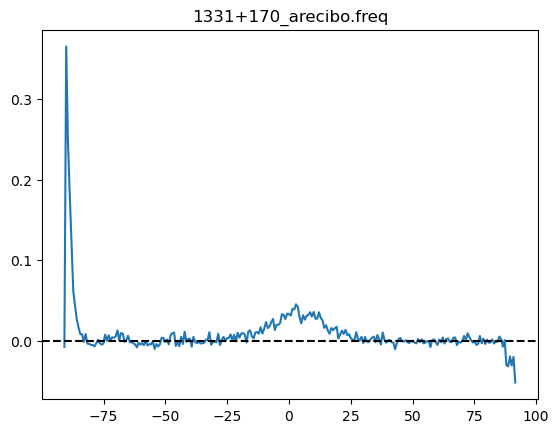

In [73]:
path = './data/Kanekar/21cm_spc/1331+170_arecibo.freq'
name = path.split('/')[-1]
z0 = 1.7763
S = 0.62
f0 = 1420405752/(1 + z0)
loaded = np.loadtxt(path)
c = 299792.458
# velocity = [((f0 - x)*c)/x for x in loaded[:,0]]
velocity = loaded[:,1]


optical_depth = -np.log(loaded[:,3])
spec = np.column_stack([velocity, optical_depth])

l = zip(velocity, optical_depth)
df = pd.DataFrame(l, columns=["velocity","tau"])
np.savetxt('./optical_depth_vs_velocity/Intervening_spectra/'+name, df.values, fmt='%f')
plt.plot(spec[:,0], spec[:,1])
plt.title(name)
plt.axhline(y=0, color='black', linestyle='dashed')
plt.show()